Image processing and computer vision tasks include displaying, cropping, flipping, rotating,  image segmentation, classification, image restoration,  image recognition, image generation.  Also, working with images via the cloud requires storing, transmitting, and gathering images through the internet. 

Python is an excellent choice as it has many image processing tools, computer vision and artificial intelligence libraries. Finally, it has many libraries for working with files in the cloud and on the internet.

A digital image is simply a file in your computer. In this lab, you will gain an understanding of these files and learn to work with these files with the Pillow Library (PIL).

<ul>
    <li><a href='#PIL'>Python Image Libraries </a>
        <ul>
            <li>Image Files and Paths  </li>
            <li>Load in Image in Python</li>
            <li>Plotting an Image </li>
            <li>Gray Scale Images, Quantization and Color Channels  </li>
            <li> PIL Images into NumPy Arrays  </li>
        </ul>
    </li>
    
</ul>


Download the images for the lab:


In [1]:
image_urls = ['https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/lenna.png',
            'https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/baboon.png',
            'https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/barbara.png']

In [2]:
filename_urls = ['cat.png',
                 'baboon.png',
                 'barbara.png']

In [3]:
import requests

def download_images(filenames, urls):
    for filename, url in zip(filenames, urls):
        response = requests.get(url)
        if response.status_code == 200:
            with open(filename, "wb") as f:
                f.write(response.content)
            print(f"File downloaded as {filename}")
        else:
            print(f"Failed to download file: {response.status_code}")

In [4]:
download_images(filename_urls, image_urls)

File downloaded as cat.png
File downloaded as baboon.png
File downloaded as barbara.png


First, let's define a helper function to concatenate two images side-by-side. You will not need to understand the code below at this moment, but this function will be used repeatedly in this tutorial to showcase the results.

In [26]:
def get_concat_h(im1, im2):
    #https://note.nkmk.me/en/python-pillow-concat-images/
    dst = Image.new('RGB', (im1.width + im2.width, im1.height))
    dst.paste(im1, (0, 0))
    dst.paste(im2, (im1.width, 0))
    return dst

Defining image paths

In [27]:
lenna_IMG = 'lenna.png'
baboon_IMG = 'baboon.png'
barbara_IMG = 'barbara.png'

images = [lenna_IMG,baboon_IMG, barbara_IMG]

## Load Images in Python

Pillow (PIL) library is a popular library for loading images in Python. In addition, many other libraries such as "Keras" and "PyTorch" use this library to work with images. The `Image` module provides functions to load images from and saving images to the file system. Let's import it from `PIL`.


In [28]:
from PIL import Image

def loadimage(images):
    for image_path in images:
        image = Image.open(image_path)  # Open the image
        print(f"Image type: {type(image)}")  # Print the type of the image object
        image.show()  # Display the image

loadimage(images)

Image type: <class 'PIL.PngImagePlugin.PngImageFile'>
Image type: <class 'PIL.PngImagePlugin.PngImageFile'>
Image type: <class 'PIL.PngImagePlugin.PngImageFile'>


You can also use <code>imshow</code> method from the <code>matplotlib</code> library to display the image.


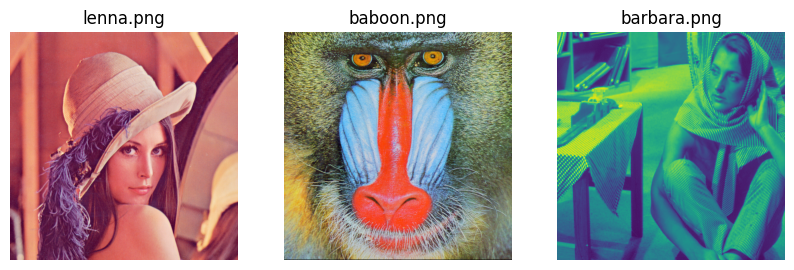

In [29]:
import matplotlib.pyplot as plt

def load_and_display_images(image_paths):
    plt.figure(figsize=(10, 10))  # Set the figure size
    
    for i, image_path in enumerate(image_paths):
        image = Image.open(image_path)  # Open the image using PIL
        plt.subplot(1, len(image_paths), i + 1)  # Create a subplot for each image
        plt.imshow(image)  # Display the image
        plt.title(image_path)  # Set the title as the image file name
        plt.axis('off')  # Turn off axis
    
    plt.show()  # Display all images

# Call the function to load and display the images
load_and_display_images(images)

We can use the attributes of the image object to get information. The attribute format is the extension or format of the image.


The attribute `size` returns a tuple, the first element is the number of pixels that comprise the width and the second element is the number of pixels that make up the height of the image.   

This is a string specifying the pixel format used. In this case, it's “RGB”. RGB is a color space where red, green, and blue are added together to produce other colors.

The `Image.open` method does not load image data into the computer memory. The `load` method of `PIL` object reads the file content, decodes it, and expands the image into memory.

We can then check the intensity of the image at the $x$-th column and $y$-th row:


In [30]:
def get_image_data(image_paths):
    for i, image_path in enumerate(image_paths):
        image = Image.open(image_path)  # Open the image using PIL
        print(f"Image {i + 1}:")
        print(f"  Size: {image.size}")  # Print image size (width, height)
        print(f"  Mode: {image.mode}")  # Print image mode (e.g., RGB, L)
        
        im = image.load()  # Load pixel data
        x, y = 0, 1  # Coordinates for the pixel (y, x)
        
        if x < image.size[0] and y < image.size[1]:  # Ensure pixel is within bounds
            print(f"  Pixel value at (0,1): {im[x, y]}")  # Print pixel value at (0,1)
        else:
            print(f"  Pixel at (0,1) is out of bounds for this image.")
        print()  # Print a blank line for separation between images

get_image_data(images)

Image 1:
  Size: (512, 512)
  Mode: RGB
  Pixel value at (0,1): (226, 137, 125)

Image 2:
  Size: (512, 512)
  Mode: RGB
  Pixel value at (0,1): (120, 125, 62)

Image 3:
  Size: (512, 512)
  Mode: L
  Pixel value at (0,1): 171



## Grayscale Images, Quantization and Color Channels  

### Grayscale Images


The `ImageOps` module contains several ‘ready-made’ image processing operations. This module is somewhat experimental, and most operators only work with grayscale and/or RGB images.

Grayscale images have pixel values representing the amount of light or intensity of that pixel. Light shades of gray have a high-intensity while darker shades have a lower intensity, i.e, white has the highest intensity and black the lowest.

The mode is `L` for grayscale.


In [31]:
from PIL import ImageOps 

def greyscale_images(image_paths):
    for image_path in image_paths:
        image = Image.open(image_path) 
        image_gray = ImageOps.grayscale(image)
        image_gray.show()

greyscale_images(images)

### Quantization

The Quantization of an image is the number of unique intensity values any given pixel of the image can take. For a grayscale image, this means the number of different shades of gray. Most images have 256 different levels. You can decrease the levels using the method `quantize`. Let's repeatably cut the number of levels in half and observe what happens:

Half the levels do not make a noticable difference.


In [32]:
def quantize_images(image_paths):
    for image_path in image_paths:
        image = Image.open(image_path) 
        image_gray = ImageOps.grayscale(image)
        image_gray.quantize(256 // 2)
        image_gray.show()

quantize_images(images)

Let’s continue dividing the number of values by two and compare it to the original image.


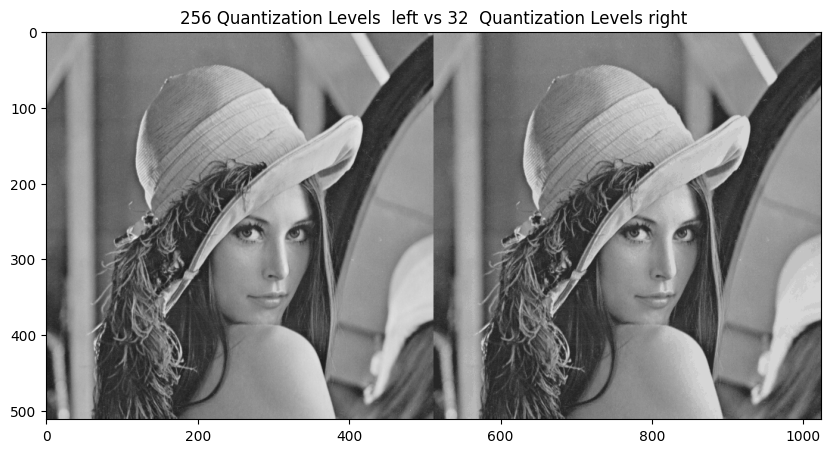

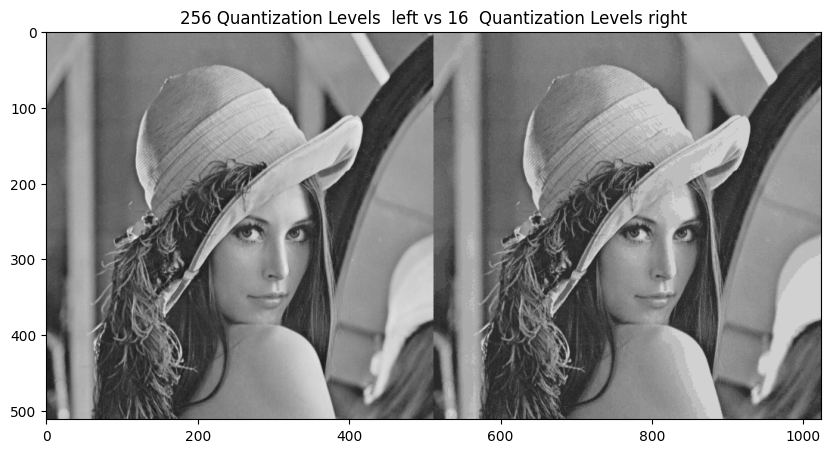

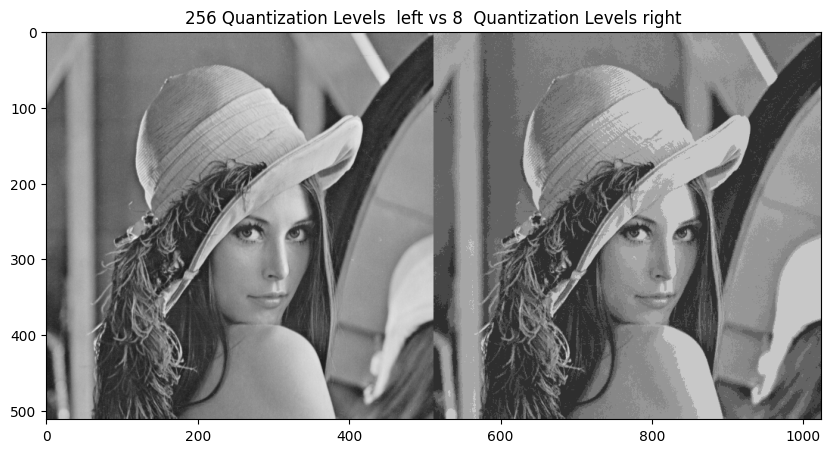

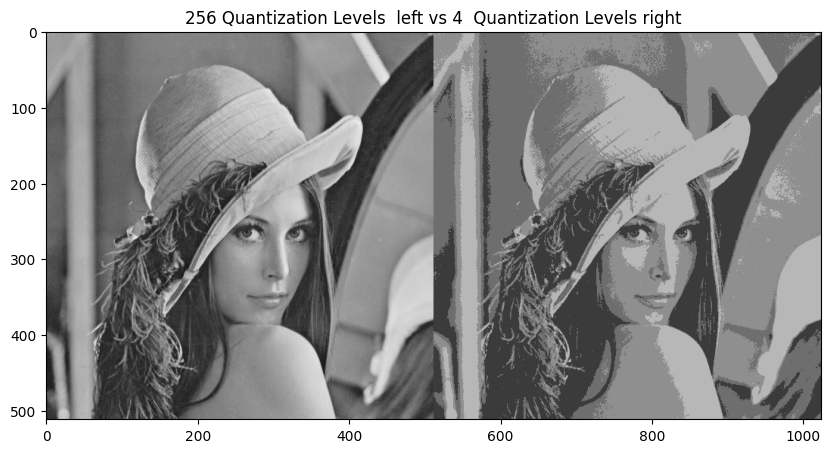

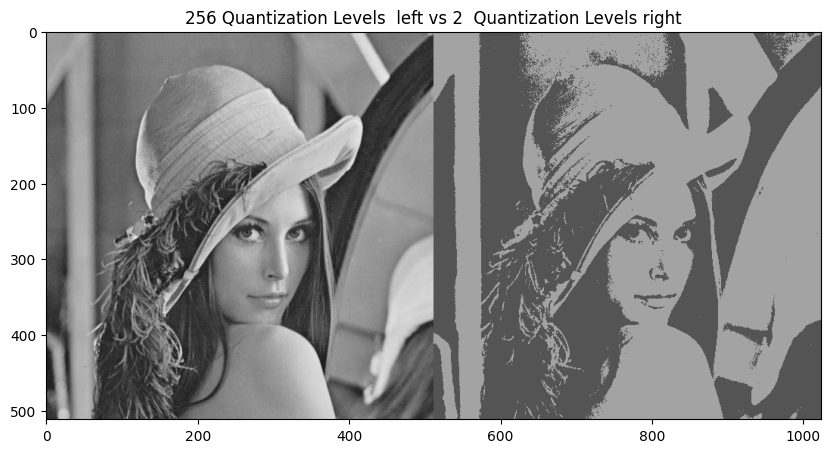

...

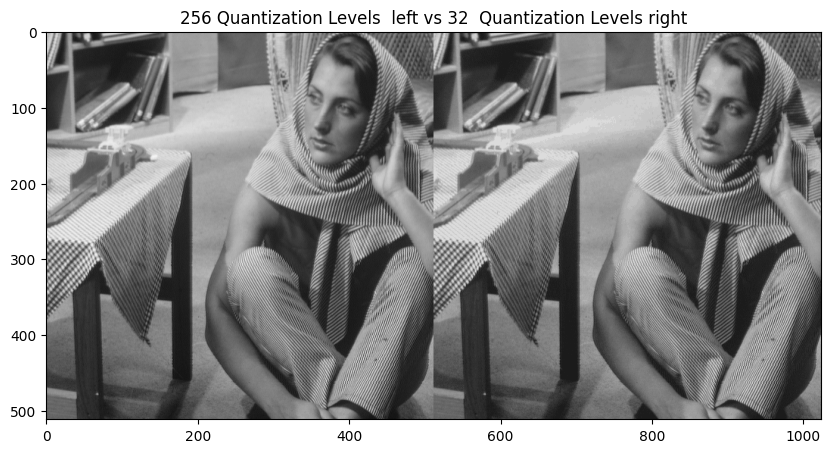

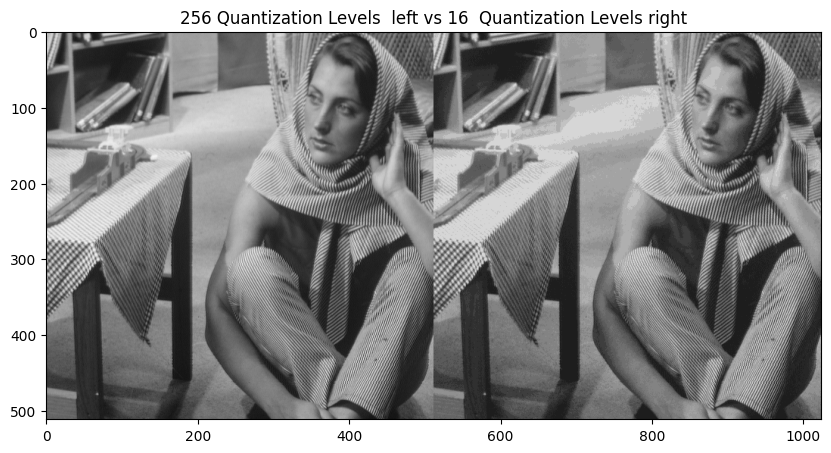

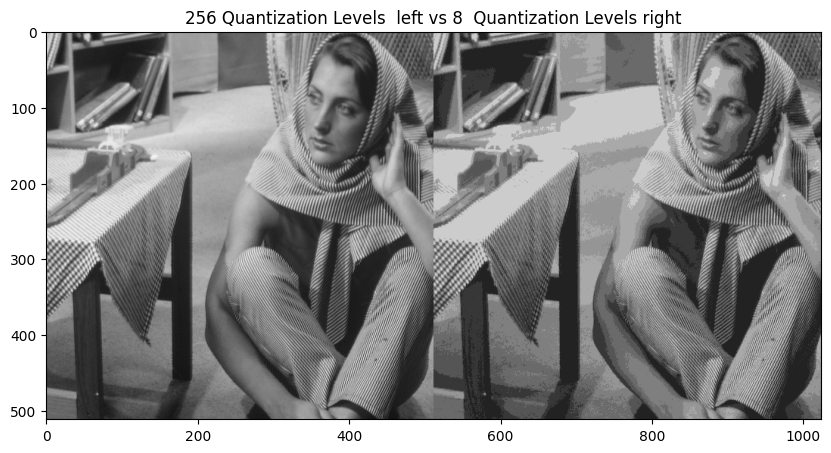

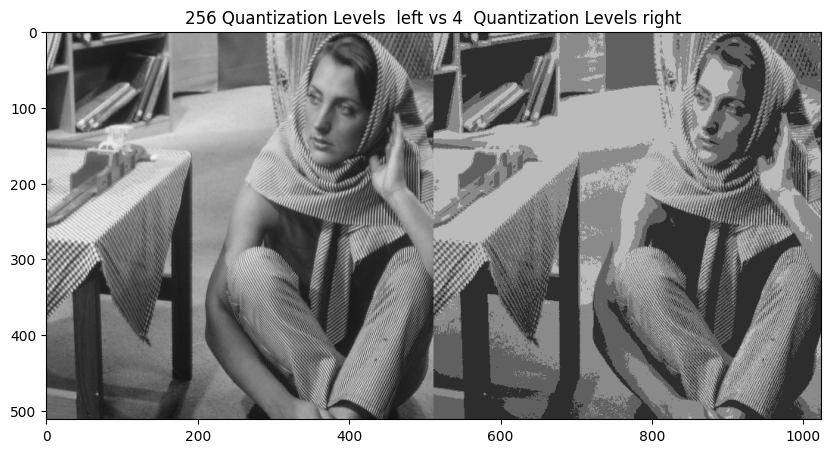

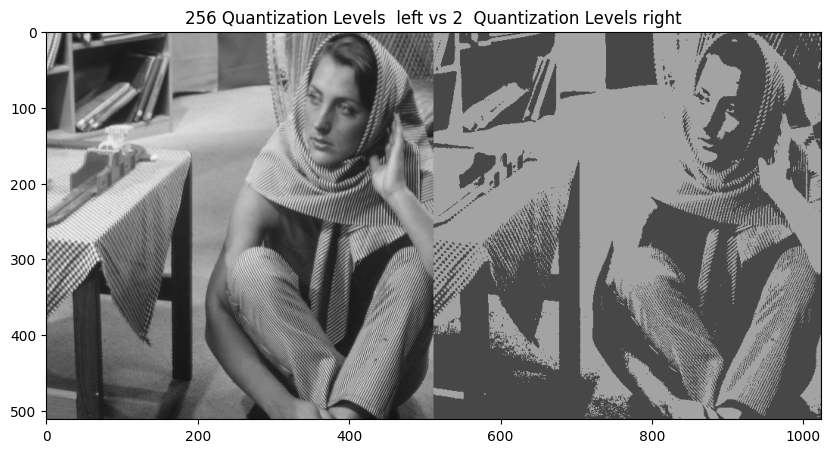

In [33]:
def quantize_images(image_paths):
    for image_path in image_paths:
        image = Image.open(image_path) 
        image_gray = ImageOps.grayscale(image)
        image_gray.quantize(256 // 2)
        # image_gray.show()
        # get_concat_h(image_gray,  image_gray.quantize(256//2)).show(title="Lena") 
        for n in range(3,8):
            plt.figure(figsize=(10,10))

            plt.imshow(get_concat_h(image_gray,  image_gray.quantize(256//2**n))) 
            plt.title("256 Quantization Levels  left vs {}  Quantization Levels right".format(256//2**n))
            plt.show()

quantize_images(images)

### Color Channels  

We can also work with the different color channels. Consider the following image:


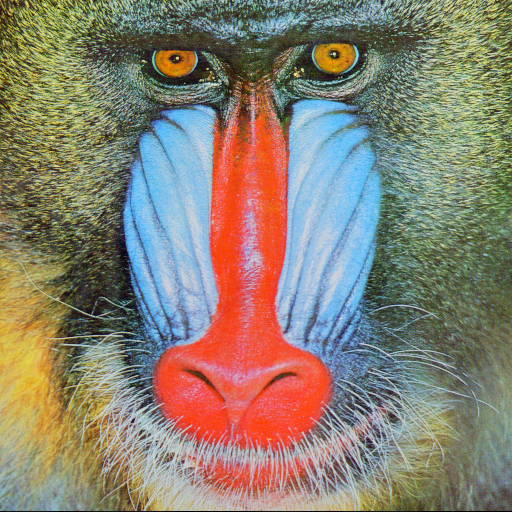

In [34]:
baboon = Image.open('baboon.png')
baboon

We can obtain the different RGB color channels and assign them to the variables <code>red</code>, <code>green</code>, and <code>blue</code>:


In [35]:
red, green, blue = baboon.split()

Plotting the color image next to the red channel as a grayscale, we see that regions with red have higher intensity values.


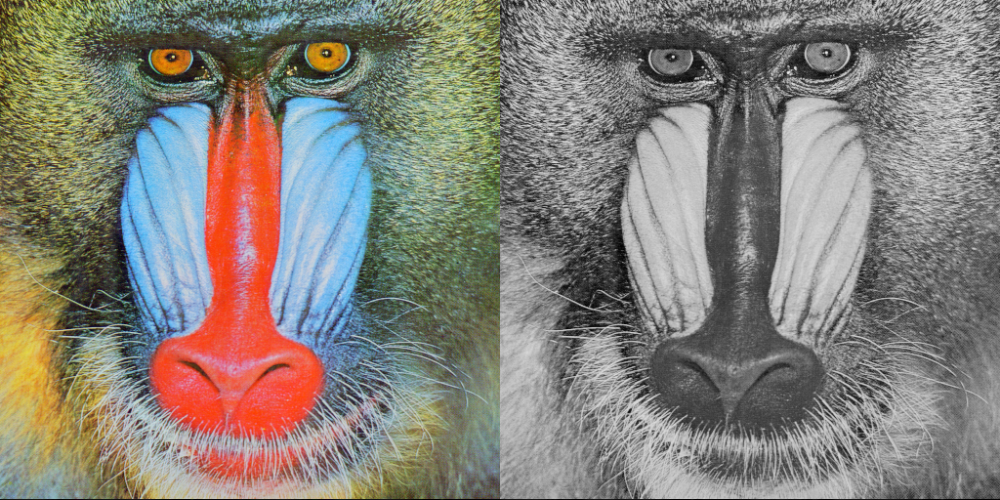

In [36]:
get_concat_h(baboon, red)
get_concat_h(baboon, blue)
get_concat_h(baboon, green)

## PIL Images into NumPy Arrays

NumPy is a library for Python, allowing you to work with multi-dimensional arrays and matrices. We can convert a PIL image to a NumPy array. We use <code>asarray()</code> or <code>array</code> function from NumPy to convert PIL images into NumPy arrays. 

First, let's import the numpy module:


In [37]:
import numpy as np

We apply it to the <code>PIL</code> image we get a numpy array:

`np.asarray` turns the original image into a numpy array. Often, we don't want to manipulate the image directly, but instead, create a copy of the image to manipulate. The `np.array` method creates a new copy of the image, such that the original one will remain unmodified.

The attribute  <code>shape</code> of a `numpy.array` object returns a tuple corresponding to the dimensions of it, the first element gives the number of rows or height of the image,  the second is element is the number of columns or width of the image. The final element is the number of colour channels.

or <code>(rows, columns, colors)</code>. Each element in the color axis  corresponds to the following value  <code>(R, G, B)</code> format.

We can view the intensity values by printing out the array, they range from 0 to 255 or $2^{8}$ (8-bit).

The Intensity values are  8-bit unsigned datatype.

We can find the maximum and minimum intensity value of the array:      



In [38]:
def PIL_to_numpy_arrays(image_paths):
    for image_path in image_paths:
        image = Image.open(image_path)
        array= np.asarray(image)
        print(type(array))
        print(array.shape)
        print(array)
        array[0, 0]
        print(f"Min value: {array.min()}, Max value: {array.max()}")
        

PIL_to_numpy_arrays(images)

<class 'numpy.ndarray'>
(512, 512, 3)
[[[226 137 125]
  [226 137 125]
  [223 137 133]
  ...
  [230 148 122]
  [221 130 110]
  [200  99  90]]

 [[226 137 125]
  [226 137 125]
  [223 137 133]
  ...
  [230 148 122]
  [221 130 110]
  [200  99  90]]

 [[226 137 125]
  [226 137 125]
  [223 137 133]
  ...
  [230 148 122]
  [221 130 110]
  [200  99  90]]

 ...

 [[ 84  18  60]
  [ 84  18  60]
  [ 92  27  58]
  ...
  [173  73  84]
  [172  68  76]
  [177  62  79]]

 [[ 82  22  57]
  [ 82  22  57]
  [ 96  32  62]
  ...
  [179  70  79]
  [181  71  81]
  [185  74  81]]

 [[ 82  22  57]
  [ 82  22  57]
  [ 96  32  62]
  ...
  [179  70  79]
  [181  71  81]
  [185  74  81]]]
Min value: 3, Max value: 255
<class 'numpy.ndarray'>
(512, 512, 3)
[[[164 150  71]
  [ 63  57  31]
  [ 75  43  10]
  ...
  [117 119  68]
  [141 170 101]
  [179 188 118]]

 [[120 125  62]
  [135  97  33]
  [ 55  35  23]
  ...
  [122 140  98]
  [136 159 128]
  [120 138  74]]

 [[ 99  74  31]
  [132 118  46]
  [ 60  41  36]
  ...
  [

### Indexing  

You can plot the array as an image:


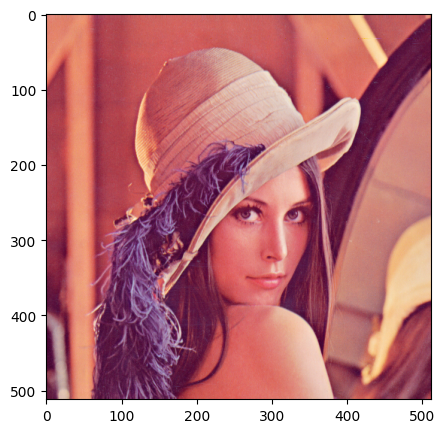

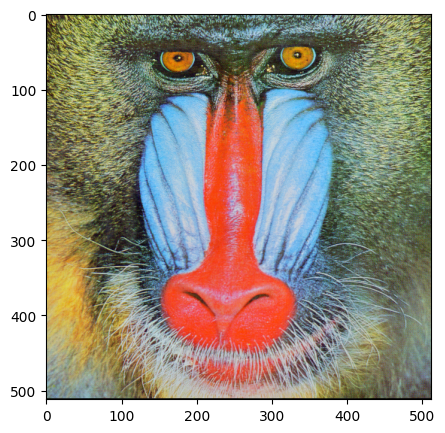

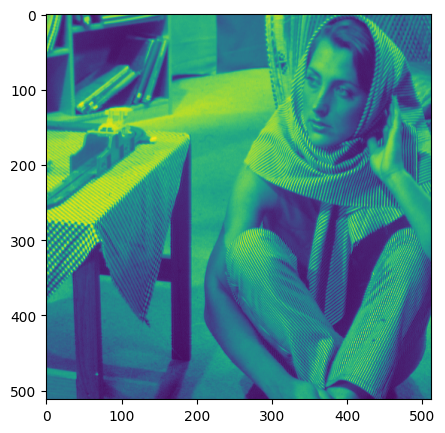

In [39]:
def PIL_to_numpy_arrays(image_paths):
    for image_path in image_paths:
        image = Image.open(image_path)
        array= np.asarray(image)
        plt.figure(figsize=(5,5))
        plt.imshow(array)
        plt.show()
        

PIL_to_numpy_arrays(images)

We can use numpy slicing, for example, we can return the first 256 rows corresponding to the top half of the image:


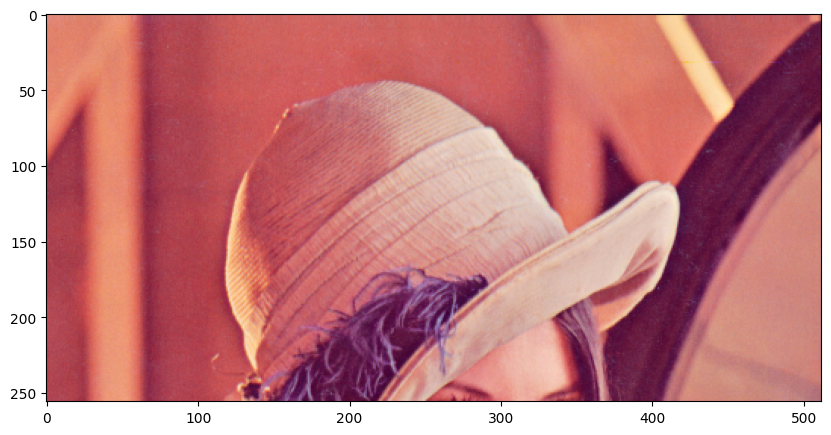

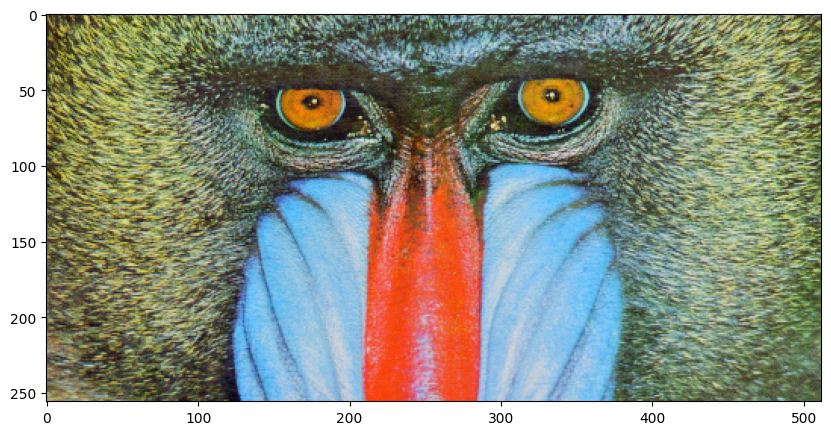

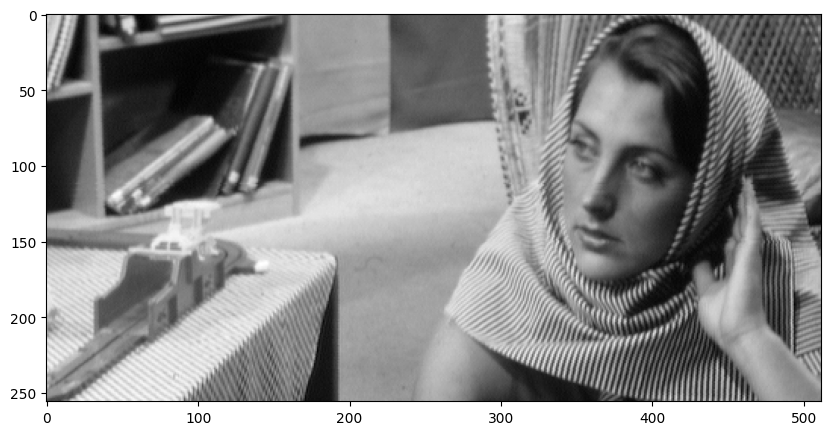

In [40]:
def PIL_to_numpy_arrays(image_paths):
    for image_path in image_paths:
        image = Image.open(image_path)
        array = np.asarray(image)
        
        rows = 256
        plt.figure(figsize=(10, 10))
        
        # Check the number of dimensions
        if array.ndim == 2:
            # Grayscale image
            plt.imshow(array[0:rows, :], cmap='gray')
        elif array.ndim == 3:
            # RGB image
            plt.imshow(array[0:rows, :, :])
        
        plt.show()
        

PIL_to_numpy_arrays(images)

We can also return the first 256 columns corresponding to the first half of the image.


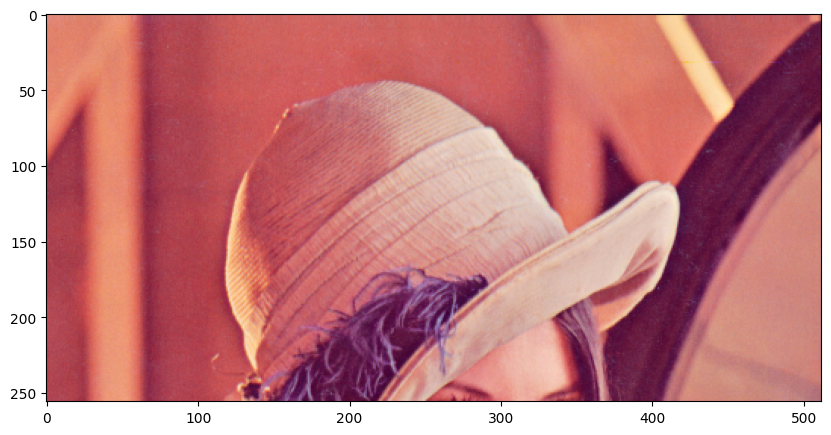

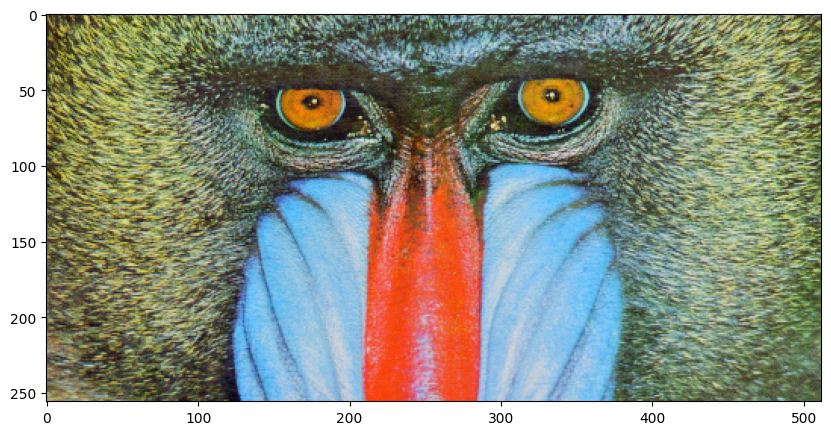

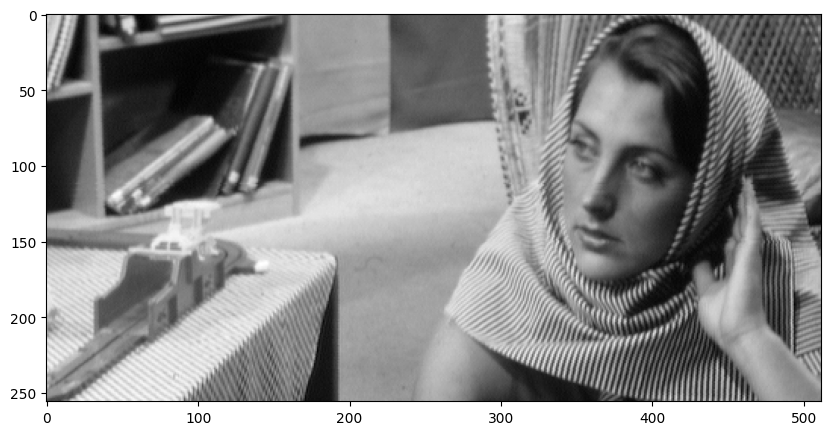

In [41]:
def PIL_to_numpy_arrays(image_paths):
    for image_path in image_paths:
        image = Image.open(image_path)
        array = np.asarray(image)
        
        coloumns = 256
        plt.figure(figsize=(10, 10))
        
        # Check the number of dimensions
        if array.ndim == 2:
            # Grayscale image
            plt.imshow(array[0:coloumns, :], cmap='gray')
        elif array.ndim == 3:
            # RGB image
            plt.imshow(array[0:coloumns, :, :])
        
        plt.show()
        

PIL_to_numpy_arrays(images)

We can also work with the different color channels. Consider the baboon image: 


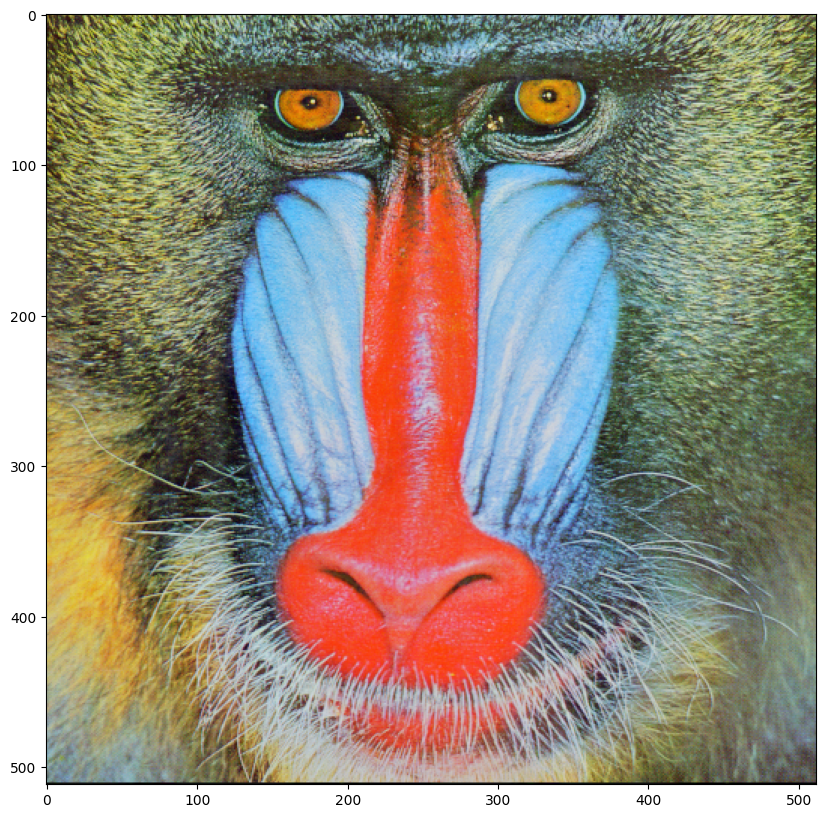

In [42]:
baboon_array = np.array(baboon)
plt.figure(figsize=(10,10))
plt.imshow(baboon_array)
plt.show()

We can plot the red channel as intensity values of the red channel.


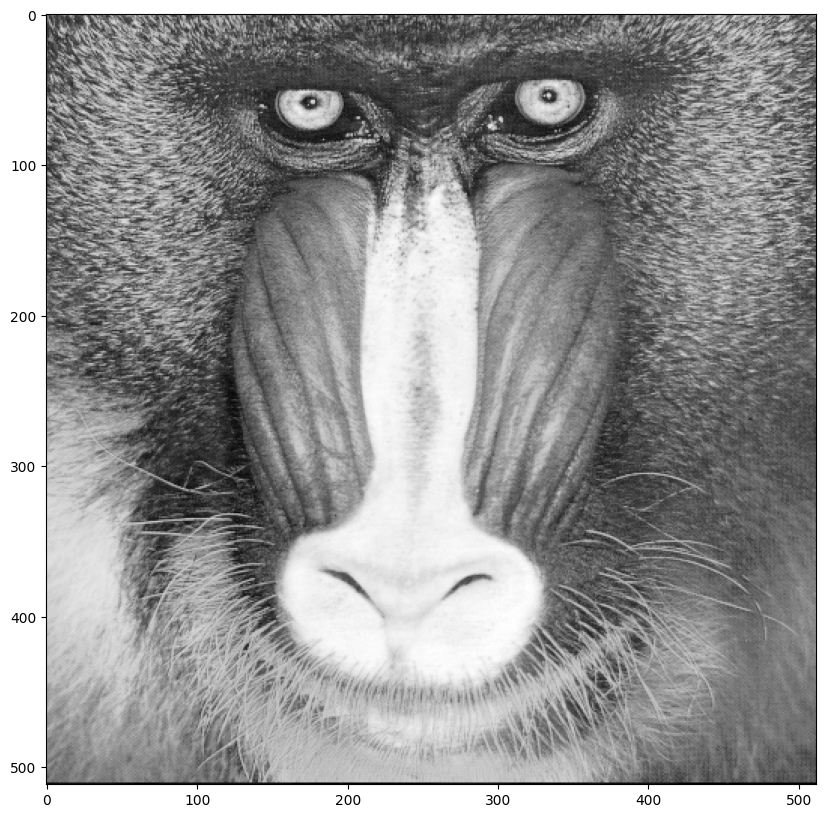

In [43]:
baboon_array = np.array(baboon)
plt.figure(figsize=(10,10))
plt.imshow(baboon_array[:,:,0], cmap='gray')
plt.show()

Or we can create a new array and set all but the red color channels to zero. Therefore, when we display the image it appears red:


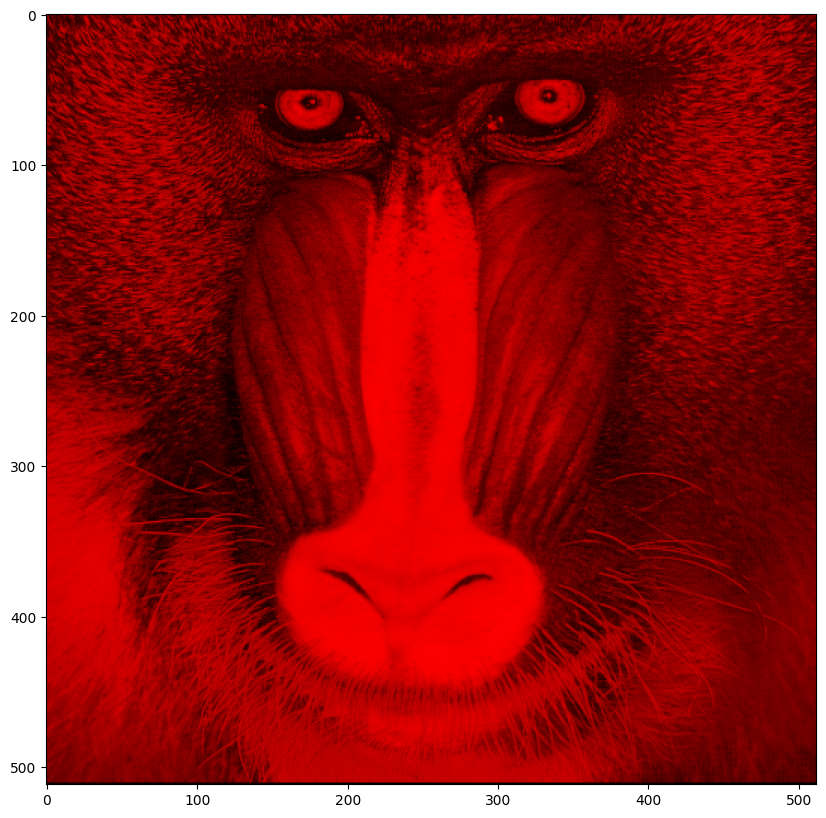

In [44]:
baboon_red=baboon_array.copy()
baboon_red[:,:,1] = 0
baboon_red[:,:,2] = 0
plt.figure(figsize=(10,10))
plt.imshow(baboon_red)
plt.show()

We can do the same for blue:


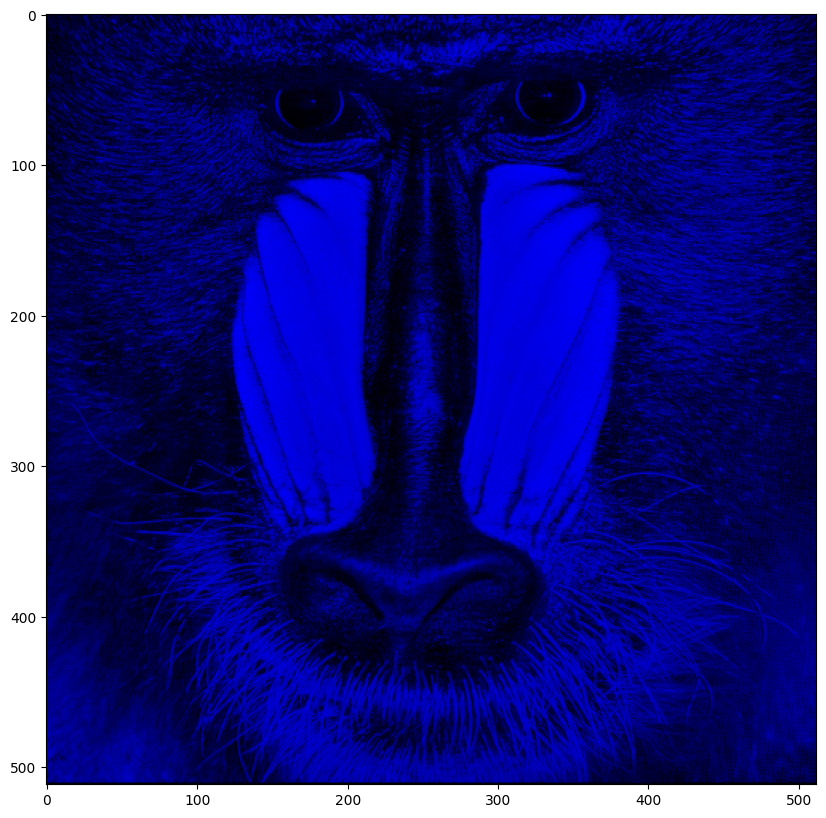

In [45]:
baboon_blue=baboon_array.copy()
baboon_blue[:,:,0] = 0
baboon_blue[:,:,1] = 0
plt.figure(figsize=(10,10))
plt.imshow(baboon_blue)
plt.show()

### Question 1: 
Use the image `lenna.png` from this lab or take any image you like.

Open the image and create a PIL Image object called `blue_lenna`, convert the image into a numpy array we can manipulate called `blue_array`, get the blue channel out of it, and finally plot the image


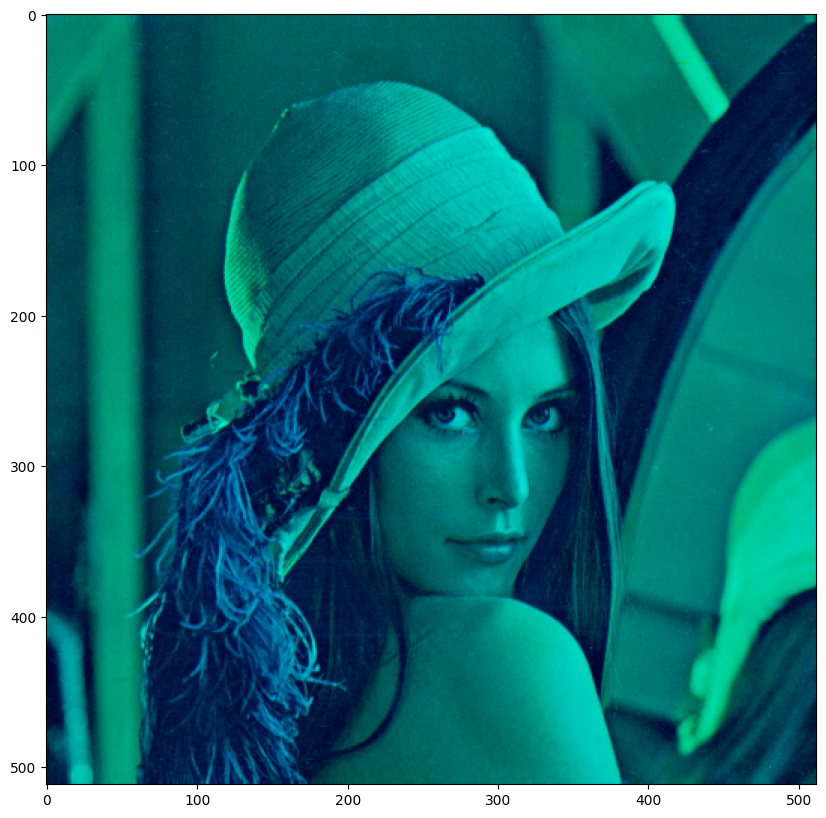

In [46]:
lenna = lenna_IMG
blue_lenna = Image.open(lenna).convert('RGB')  
blue_array = np.array(blue_lenna)
blue_array[:,:,0] = 0
plt.figure(figsize=(10,10))
plt.imshow(blue_array)
plt.show()